# Similar Image Classification

In this project, It accept an 512x512 input image and return N images from the provided dataset similar to the input image.

In [1]:
# Imported Libraries which are used in this Model
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras_tqdm import TQDMNotebookCallback
from keras.models import Model

from keras import optimizers
from keras.models import Sequential, Model
from keras.layers import (Dropout, Flatten, Dense, Conv2D, 
                          Activation, MaxPooling2D)
import os, glob
from sklearn.utils import shuffle
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import shutil
from tqdm import tqdm

Using TensorFlow backend.


In [6]:
# Define the size of the Image
image_size = (512,512)

In [ ]:
# Animal Directory contain the all images of Animals with their labels.
more_im = glob.glob("Animal/*/*.jpg")
more_im = shuffle(more_im)

# Here we have split the images for Training and validation

tiger = [x for x in more_im if "tiger" in x.split("\\")[-2]]
male_lion = [x for x in shuffle(more_im) if "male_lion" in x.split("\\")[-2]]
female_lion = [x for x in shuffle(more_im) if "female_lion" in x.split("\\")[-2]]
cheetah = [x for x in more_im if "cheetah" in x.split("\\")[-2]]
fox = [x for x in more_im if "fox" in x.split("\\")[-2]]
leopard = [x for x in more_im if "leopard" in x.split("\\")[-2]]
wolf = [x for x in more_im if "wolf" in x.split("\\")[-2]]


for_labeling = tiger + male_lion + female_lion + cheetah + fox + leopard + wolf
for_labeling = shuffle(for_labeling)

Counter([x.split("\\")[-2] for x in more_im]).most_common()

In [ ]:
#Createddirectory for Train and Validation, inside their labelled directory of each animal.

%mkdir animal_train
%mkdir animal_valid

%mkdir animal_train\\tiger
%mkdir animal_train\\male_lion
%mkdir animal_train\\female_lion
%mkdir animal_train\\leopard
%mkdir animal_train\\fox
%mkdir animal_train\\cheetah
%mkdir animal_train\\wolf


%mkdir animal_valid\\tiger
%mkdir animal_valid\\male_lion
%mkdir animal_valid\\female_lion
%mkdir animal_valid\\leopard
%mkdir animal_valid\\fox
%mkdir animal_valid\\cheetah
%mkdir animal_valid\\wolf


for index, image in tqdm(enumerate(for_labeling)):
    
    if index < 1000:
        label = image.split("\\")[-2]
        image_name = image.split("\\")[-1]
        if "tiger" in label:
            shutil.copy(image, 'animal_train\\tiger\\{}'.format(image_name))
        if "male_lion" in label:
            shutil.copy(image, 'animal_train\\male_lion\\{}'.format(image_name))
        if "female_lion" in label:
            shutil.copy(image, 'animal_train\\female_lion\\{}'.format(image_name))
        if "leopard" in label:
            shutil.copy(image, 'animal_train\\leopard\\{}'.format(image_name))
        if "fox" in label:
            shutil.copy(image, 'animal_train\\fox\\{}'.format(image_name))
        if "male_lion" in label:
            shutil.copy(image, 'animal_train\\male_lion\\{}'.format(image_name))
        if "cheetah" in label:
            shutil.copy(image, 'animal_train\\cheetah\\{}'.format(image_name))
        if "wolf" in label:
            shutil.copy(image, 'animal_train\\wolf\\{}'.format(image_name))
            
    if index > 1000:
        label = image.split("\\")[-2]
        image_name = image.split("\\")[-1]
        if "tiger" in label:
            shutil.copy(image, 'animal_valid\\tiger\\{}'.format(image_name))
        if "male_lion" in label:
            shutil.copy(image, 'animal_valid\\male_lion\\{}'.format(image_name))
        if "female_lion" in label:
            shutil.copy(image, 'animal_valid\\female_lion\\{}'.format(image_name))
        if "leopard" in label:
            shutil.copy(image, 'animal_valid\\leopard\\{}'.format(image_name))
        if "fox" in label:
            shutil.copy(image, 'animal_valid\\fox\\{}'.format(image_name))
        if "male_lion" in label:
            shutil.copy(image, 'animal_valid\\male_lion\\{}'.format(image_name))
        if "cheetah" in label:
            shutil.copy(image, 'animal_valid\\cheetah\\{}'.format(image_name))
        if "wolf" in label:
            shutil.copy(image, 'animal_valid\\wolf\\{}'.format(image_name))

In [ ]:
# Created Train and Test datagenerator from the directory

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

In [3]:
# Created train and Validation generator which will pass to our model to train and validate

train_generator = train_datagen.flow_from_directory(
    'animal_train/',
    target_size=image_size,
    batch_size=16,
    shuffle=True,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    'animal_valid/',
    target_size=image_size,
    batch_size=16,
    class_mode='categorical')

Found 2811 images belonging to 7 classes.
Found 1557 images belonging to 7 classes.


In [4]:
# I have apllied CNN Algorithm for train our model

model = Sequential()

model.add(Conv2D(32, (3, 3), input_shape=(512, 512, 3)))
model.add(Activation('relu')) #tanh
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu')) #tanh
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(96))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7)) # Multiple
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

In [5]:
#Model Summary defined below
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 510, 510, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 510, 510, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 255, 255, 32)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 255, 255, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 253, 253, 32)      9248      
_________________________________________________________________
activation_2 (Activation)    (None, 253, 253, 32)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 126, 126, 32)     

In [7]:
#Fit and train our model
# I have trained model with 35 epochs
model.fit(
    train_generator,
    steps_per_epoch= 7500 // 16, # Here 16 is the batch size.
    epochs=35,
    verbose=1,
    callbacks=[TQDMNotebookCallback()],
    validation_data=validation_generator,
    validation_steps=600 // 16)

Epoch 1/35


468/468 [==============================] - 1501s 3s/step - loss: 1.6468 - accuracy: 0.4140 - val_loss: 0.9511 - val_accuracy: 0.7314
Epoch 2/35


468/468 [==============================] - 1489s 3s/step - loss: 0.7477 - accuracy: 0.7417 - val_loss: 0.9007 - val_accuracy: 0.7568
Epoch 3/35


468/468 [==============================] - 1485s 3s/step - loss: 0.5812 - accuracy: 0.8026 - val_loss: 0.2027 - val_accuracy: 0.8434
Epoch 4/35


468/468 [==============================] - 1488s 3s/step - loss: 0.5049 - accuracy: 0.8393 - val_loss: 0.2933 - val_accuracy: 0.8446
Epoch 5/35


468/468 [==============================] - 1536s 3s/step - loss: 0.4752 - accuracy: 0.8497 - val_loss: 0.2737 - val_accuracy: 0.8919
Epoch 6/35


468/468 [==============================] - 1471s 3s/step - loss: 0.4549 - accuracy: 0.8563 - val_loss: 0.1289 - val_accuracy: 0.8985
Epoch 7/35


468/468 [==============================] - 1472s 3s/step - loss: 0.4072 - accuracy: 0.8693 - val_loss: 0.4908 - val_accuracy: 0.8666
Epoch 8/35


468/468 [==============================] - 1471s 3s/step - loss: 0.4208 - accuracy: 0.8689 - val_loss: 0.6119 - val_accuracy: 0.8176
Epoch 9/35


468/468 [==============================] - 1467s 3s/step - loss: 0.4000 - accuracy: 0.8747 - val_loss: 0.2799 - val_accuracy: 0.9155
Epoch 10/35


468/468 [==============================] - 1471s 3s/step - loss: 0.3914 - accuracy: 0.8753 - val_loss: 0.4203 - val_accuracy: 0.8632
Epoch 11/35


468/468 [==============================] - 1533s 3s/step - loss: 0.4087 - accuracy: 0.8776 - val_loss: 0.5098 - val_accuracy: 0.8744
Epoch 12/35


468/468 [==============================] - 1544s 3s/step - loss: 0.3741 - accuracy: 0.8800 - val_loss: 0.4044 - val_accuracy: 0.8395
Epoch 13/35


468/468 [==============================] - 1544s 3s/step - loss: 0.3960 - accuracy: 0.8789 - val_loss: 0.4702 - val_accuracy: 0.8716
Epoch 14/35


468/468 [==============================] - 1542s 3s/step - loss: 0.3920 - accuracy: 0.8756 - val_loss: 0.2011 - val_accuracy: 0.8830
Epoch 15/35


468/468 [==============================] - 1569s 3s/step - loss: 0.3982 - accuracy: 0.8762 - val_loss: 0.5707 - val_accuracy: 0.8666
Epoch 16/35


468/468 [==============================] - 1537s 3s/step - loss: 0.3820 - accuracy: 0.8786 - val_loss: 0.5681 - val_accuracy: 0.8124
Epoch 17/35


468/468 [==============================] - 1541s 3s/step - loss: 0.3868 - accuracy: 0.8804 - val_loss: 0.5805 - val_accuracy: 0.8328
Epoch 18/35


468/468 [==============================] - 1628s 3s/step - loss: 0.3816 - accuracy: 0.8817 - val_loss: 0.4891 - val_accuracy: 0.7855
Epoch 19/35


468/468 [==============================] - 1648s 4s/step - loss: 0.3812 - accuracy: 0.8839 - val_loss: 0.9565 - val_accuracy: 0.8210
Epoch 20/35


468/468 [==============================] - 1705s 4s/step - loss: 0.3923 - accuracy: 0.8796 - val_loss: 0.3401 - val_accuracy: 0.8260
Epoch 21/35


468/468 [==============================] - 1729s 4s/step - loss: 0.3960 - accuracy: 0.8827 - val_loss: 0.6256 - val_accuracy: 0.8243
Epoch 22/35


468/468 [==============================] - 1669s 4s/step - loss: 0.3702 - accuracy: 0.8844 - val_loss: 0.2845 - val_accuracy: 0.8778
Epoch 23/35


468/468 [==============================] - 1592s 3s/step - loss: 0.3840 - accuracy: 0.8847 - val_loss: 0.4753 - val_accuracy: 0.8024
Epoch 24/35


468/468 [==============================] - 1593s 3s/step - loss: 0.3706 - accuracy: 0.8846 - val_loss: 0.6255 - val_accuracy: 0.8399
Epoch 25/35


468/468 [==============================] - 1591s 3s/step - loss: 0.3914 - accuracy: 0.8822 - val_loss: 0.6489 - val_accuracy: 0.7584
Epoch 26/35


468/468 [==============================] - 1589s 3s/step - loss: 0.3970 - accuracy: 0.8817 - val_loss: 1.2138 - val_accuracy: 0.6689
Epoch 27/35


468/468 [==============================] - 1587s 3s/step - loss: 0.3873 - accuracy: 0.8816 - val_loss: 0.7144 - val_accuracy: 0.8210
Epoch 28/35


468/468 [==============================] - 1587s 3s/step - loss: 0.3739 - accuracy: 0.8919 - val_loss: 1.2357 - val_accuracy: 0.6064
Epoch 29/35


468/468 [==============================] - 1579s 3s/step - loss: 0.3976 - accuracy: 0.8802 - val_loss: 0.8567 - val_accuracy: 0.7027
Epoch 30/35


468/468 [==============================] - 1582s 3s/step - loss: 0.3927 - accuracy: 0.8824 - val_loss: 0.4349 - val_accuracy: 0.7556
Epoch 31/35


468/468 [==============================] - 1583s 3s/step - loss: 0.3831 - accuracy: 0.8768 - val_loss: 0.7111 - val_accuracy: 0.6486
Epoch 32/35


468/468 [==============================] - 1584s 3s/step - loss: 0.3911 - accuracy: 0.8768 - val_loss: 1.7349 - val_accuracy: 0.6609
Epoch 33/35


468/468 [==============================] - 1584s 3s/step - loss: 0.3924 - accuracy: 0.8774 - val_loss: 1.5928 - val_accuracy: 0.3361
Epoch 34/35


468/468 [==============================] - 1582s 3s/step - loss: 0.3891 - accuracy: 0.8848 - val_loss: 2.1340 - val_accuracy: 0.5017
Epoch 35/35


468/468 [==============================] - 1583s 3s/step - loss: 0.4035 - accuracy: 0.8802 - val_loss: 0.5473 - val_accuracy: 0.7177



I got 88.02% of accuracy.

In [141]:
#Saved my model.
model.save('Similar_Animal_Model.hdf5')

## Now from here we will see how my model is working.

In [14]:
# Generator for our similarity work
# Here Animal Directory contain all the Animals images
# sim_gen is image generator from the Animal Directory
sim_gen = test_datagen.flow_from_directory(
    'Animal/',
    target_size=(512, 512),
    batch_size=1, shuffle=False,
    class_mode='categorical')

Found 4456 images belonging to 7 classes.


In [11]:
layer_name = 'dense_1' #This name taken from the model.summary()
intermediate_layer_model = Model(inputs=model.input,
                                 outputs=model.get_layer(layer_name).output)

intermediate_output = intermediate_layer_model.predict_generator(generator=sim_gen, steps=4455)

Found 4456 images belonging to 7 classes.


Here I have used Similarity Matrix technique to get similar images.

In [12]:
# base similarity matrix (all dot products)
# replace this with A.dot(A.T).toarray() for sparse representation
similarity = np.dot(intermediate_output, intermediate_output.T)

# squared magnitude of preference vectors (number of occurrences)
square_mag = np.diag(similarity)

# inverse squared magnitude
inv_square_mag = 1 / square_mag

# if it doesn't occur, set it's inverse magnitude to zero (instead of inf)
inv_square_mag[np.isinf(inv_square_mag)] = 0

# inverse of the magnitude
inv_mag = np.sqrt(inv_square_mag)

# cosine similarity (elementwise multiply by inverse magnitudes)
cosine = similarity * inv_mag
cosine = cosine.T * inv_mag

Here cosine contains all the prediction of images

In [145]:
cosine.shape

(4455, 4455)

In [9]:
# Function to get the image from the Animal directory for output
def load_an_image2(file_name):
    _img = image.load_img(

        os.path.join(os.getcwd() + '\\Animal\\',  file_name)
       , 
        target_size=(512, 512)

    )
    return _img

In [10]:
# Only those images will be sgown in the output which have 90% matching with the input image
def similar_image(li,pred_val):
    res = []
    for i,val in enumerate(li):
        if val > 0.9:
            res.append(pred_val[i])
    return res

In [11]:
#Lets Provide the input of image and see how many similar images i can get

li = sorted(cosine[66])[::-1]
pred_value = np.argsort(cosine[66])[::-1]

In [12]:
resulted_image = similar_image(li,pred_value)

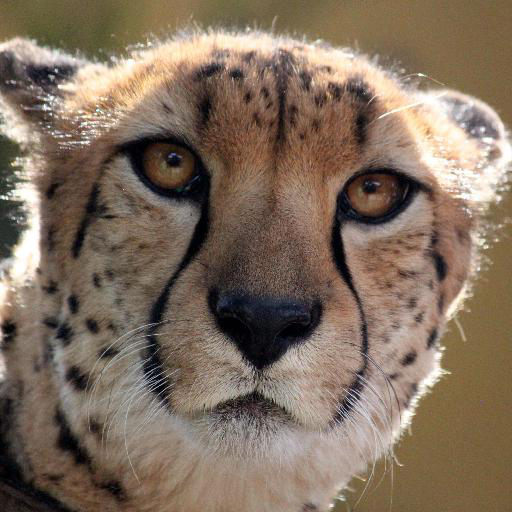

In [15]:
# This is our input image
load_an_image2(sim_gen.filenames[66])

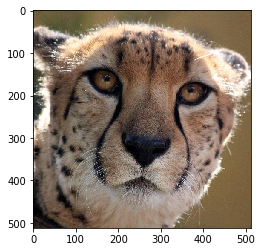

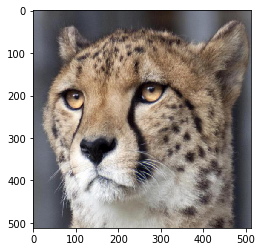

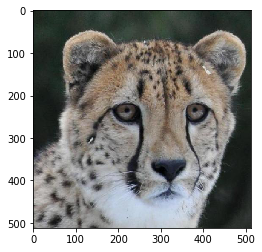

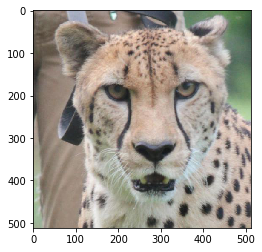

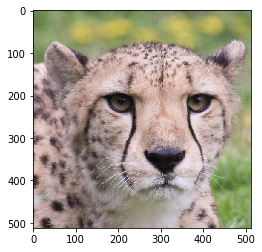

...

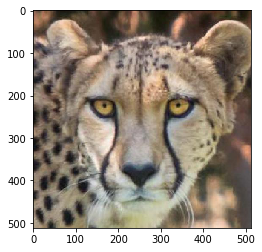

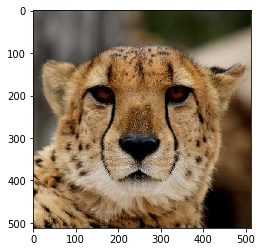

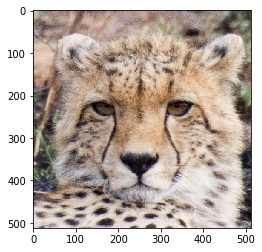

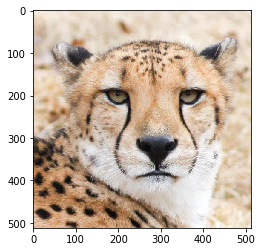

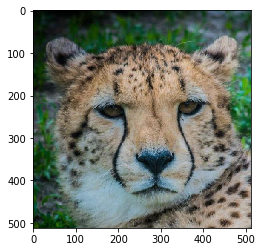

68


In [16]:
# Showing the output
ims = [load_an_image2(sim_gen.filenames[x]) for x in resulted_image]
count = 0
for i in ims:
    plt.imshow(i)
    plt.show()
    count += 1
print(count)

We Can see here, I am getting 68 similar images to the input

# Thank you